# Transformer from Scratch in PyTorch
* Notebook by Adam Lang
* Date: 6/17/2024
* In this notebook we will code a transformer from scratch in PyTorch to go over the architecture details.
* As a remind of the transformer architecture:
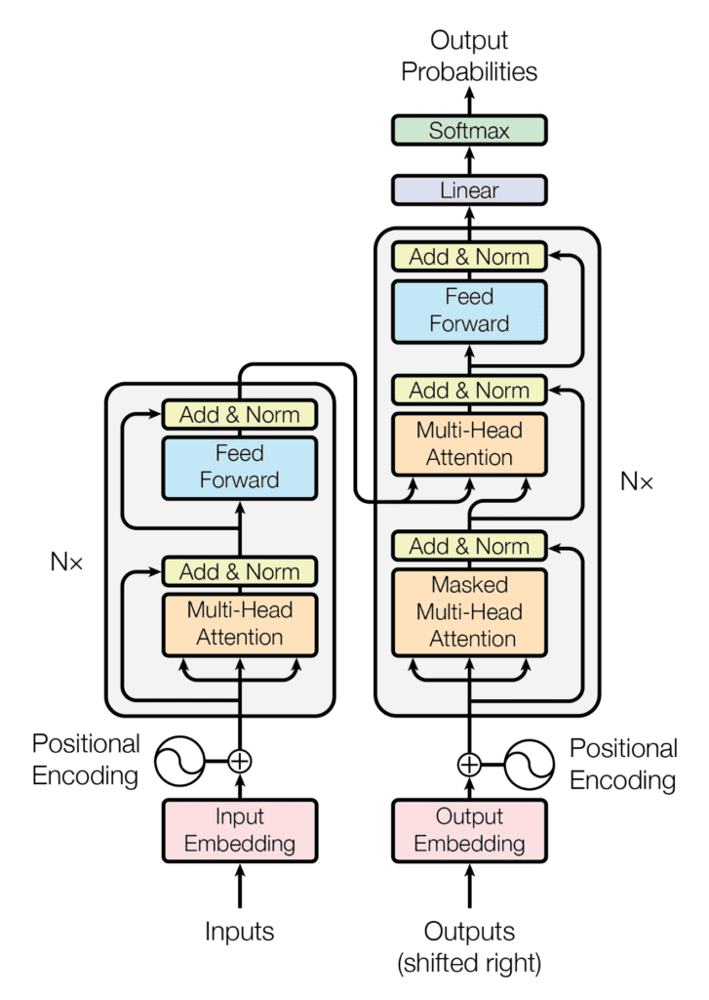

* And another simpler architecture image:

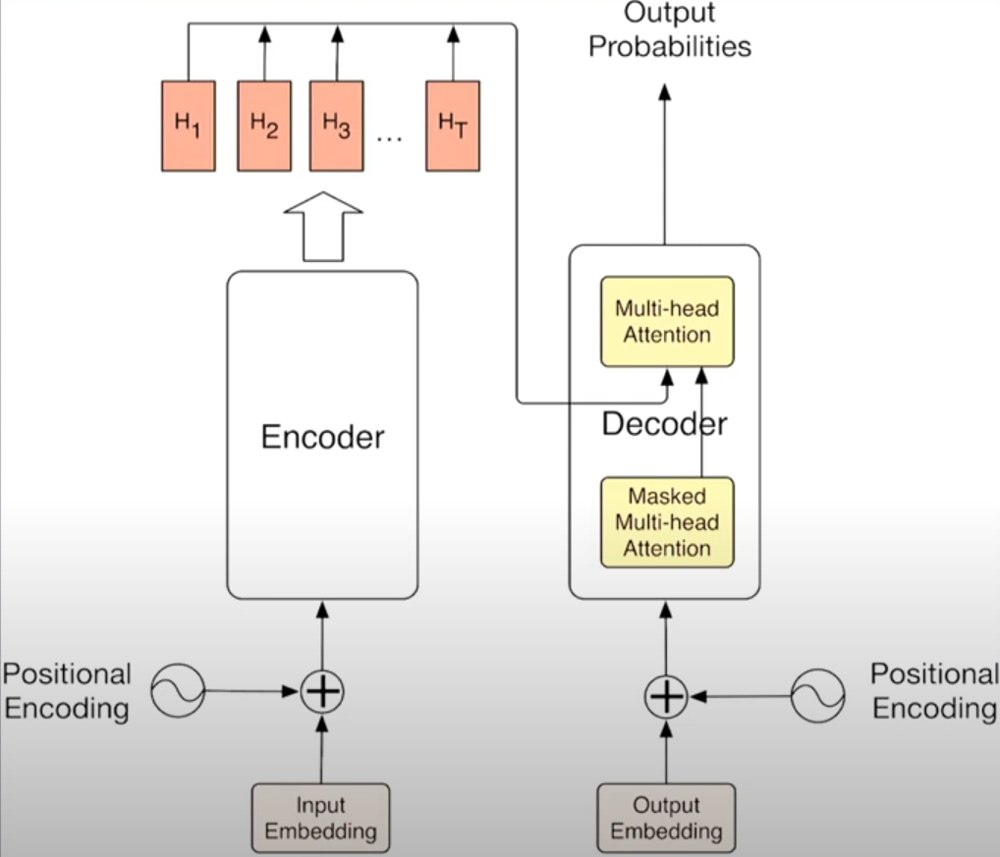

## High-Level Overview of Transformer
* Encoder is fed with input text --> input text is tokenized
* Tokenized text --> embeddings
* Encoder is composed of:
  * Stacked blocks (analagous to stacking layers in computer vision)
  * Each encoder output is fed to each decoder layer.
* Decoder takes the output of the encoder to predict/generate next token.
  * This is done until a spatial end of sequence (EOS) token is reached.

* Positional Encoding Mechanism

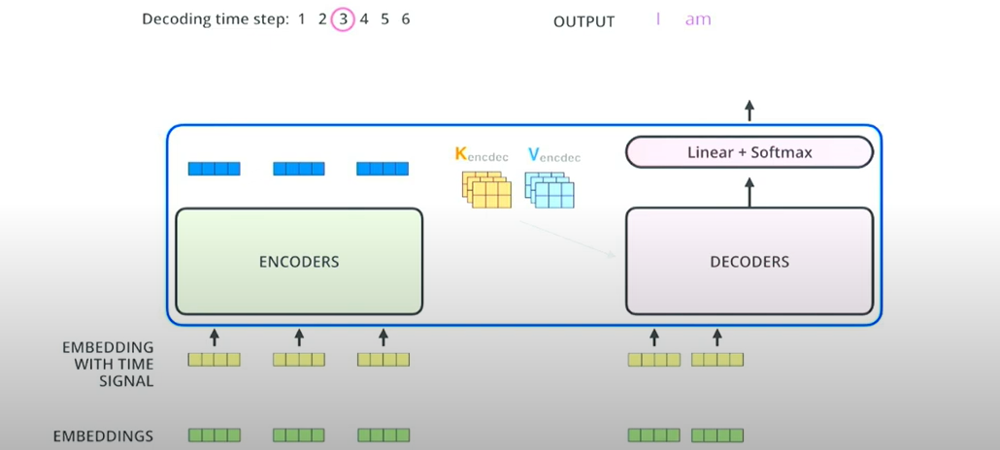

## Transformer Self-Attention Mechanism
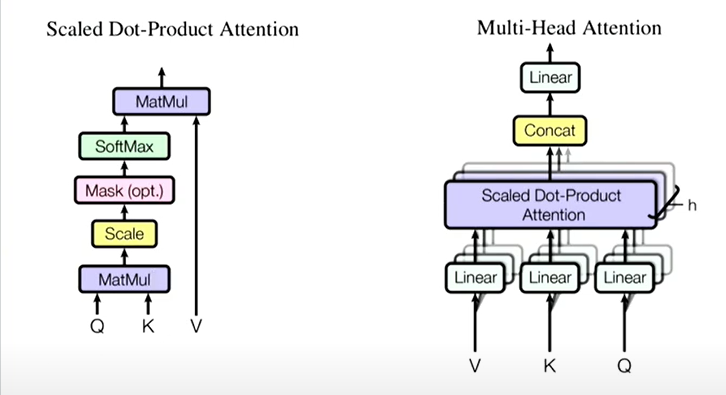

4 Main Steps to implement Attention Mechanism
* Before we go over the steps remember we had: input text --> token embeddings. Now the steps are:
1. Each token embedding --> project into vectors --> these vectors are used to eventually obtain better encodings for our source and target words.
  * Q (query) - Vector(Linear layer output) related with what we encode(output, it can be output of encoder layer or decoder layer)
  * K (key) - Vector(Linear layer output) related with what we use as input to output.
  * V (value) - Learned vector(Linear layer output) as a result of calculations, related with input

2. Compute attention score
3. Compute attention widths
4. Update token embedding with value vectors (V)

* Scaled dot product attention is the most crucial part of this.

## Visualize this

In [1]:
# install bertviz
!pip install bertviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 1.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manyl

## What is Bertviz?
* Documentation: https://pypi.org/project/bertviz/
* BertViz is an interactive tool for **visualizing attention in Transformer language models such as BERT, GPT2, or T5.**
* It can be run inside a Jupyter or Colab notebook through a simple Python API that supports most Huggingface models.
* BertViz extends the Tensor2Tensor visualization tool by Llion Jones, providing multiple views that each offer a unique lens into the attention mechanism.

In [2]:
# imports
from transformers import AutoTokenizer, AutoConfig
import torch
import torch.nn as nn

#bertviz
from bertviz.transformers_neuron_view import BertModel
from bertviz.neuron_view import show

# establish model checkpoint (the model we want to use) - bert base uncased
model_check = 'bert-base-uncased'

# instantiate a tokenizer from huggingface
tokenizer = AutoTokenizer.from_pretrained(model_check)



tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Now we can demonstrate the attention mechanism using Bertviz

In [3]:
## random text - you can use any text you want
text = "As the airplane becomes lighter, it files higher in air of lower density to maintain the same airspeed."

## define model
model = BertModel.from_pretrained(model_check)

## show output
show(model, 'bert', tokenizer, text, display_mode = 'light', layer =0, head=10)

100%|██████████| 440473133/440473133 [00:16<00:00, 27237832.49B/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Summary:
* The line width shows the semantic importance of a word it is connected to.

# Tokenization

In [4]:
## excluding add special mask tokens (CLS, SEP) for now
inputs = tokenizer(text, return_tensors='pt', add_special_tokens=False)

inputs.input_ids

tensor([[ 2004,  1996, 13297,  4150,  9442,  1010,  2009,  6764,  3020,  1999,
          2250,  1997,  2896,  4304,  2000,  5441,  1996,  2168, 14369, 25599,
          1012]])

Summary:
* These indices are the input_ids in the BERT model positional encodings.
  * Each word has been mapped to a unique id within the tokenizer vocabulary.
* We are creating Dense Embeddings (non-zero values)
  * We can use the input_ids in PyTorch to do this.

* There are also Sparse Embeddings (one-hot encodings)

### Check BERT Configs
* BERT config, or BertConfig, is an instance that holds configuration parameters for the Bidirectional Encoder Representations from Transformers (BERT) model.
* These parameters include the number of hidden layers, the hidden layer size, and the number of attention heads.

In [5]:
## now check configs from BERT configs
config = AutoConfig.from_pretrained(model_check) ## pull all configs for the BERT-base-uncased model

# print config
config

BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.41.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

These are all the configs or params set in `class transformers.BertConfig`


## Embeddings

In [6]:
## call nn.Embedding from PyTorch --> with vocab_size, hidden_size
token_embed = nn.Embedding(config.vocab_size, config.hidden_size)
# print token_embed
token_embed

Embedding(30522, 768)

* We now have an embedding which is a vector of size 30,522 x 768.
* Each input ID is mapped to a vector in the vocabulary each of size 768.

In [7]:
## token embeddings
input_embeds = token_embed(inputs.input_ids)
print(input_embeds)
print("\n")
input_embeds.size()

tensor([[[ 1.5853,  0.2569, -0.6297,  ...,  0.8581, -1.1250,  0.9378],
         [-2.1275,  0.3375,  0.5265,  ..., -1.7166,  0.6186, -0.2685],
         [ 0.6096,  0.2693,  0.9088,  ..., -0.6297, -0.6680, -1.5053],
         ...,
         [ 1.8268, -1.4192,  0.1483,  ..., -0.8642,  0.3110, -0.3908],
         [ 0.9467,  0.1888,  0.2005,  ...,  1.1391,  0.9703, -0.8969],
         [ 1.5389, -0.8008,  1.5007,  ..., -0.2529, -0.7195,  1.6776]]],
       grad_fn=<EmbeddingBackward0>)




torch.Size([1, 21, 768])

Summary:
* Above we have the input tensor, each of size:
  * batch size = 1
  * sequence length = 21
  * hidden dimension = 768

## Calculate the Q, K, V scores and use dot product as attention function
* Query
* Key
* Value

* We will use `torch.bmm` which performs a batch matrix-matrix product of matrices stored in input and mat2.
  * docs: https://pytorch.org/docs/stable/generated/torch.bmm.html

In [8]:
## query, key, value
import torch
from math import sqrt # sqrt vectors

# create Q, K, V to all have same values - this is not alwasy true but for simplicity
query = key = value = input_embeds

# last dimension of input tensor above
dim_k = key.size(-1)

# create attention scores
# torch.bmm takes 2 batches of matrices and multiples them together (matmul cant do this)
scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(dim_k)

# get score size
scores.size()

torch.Size([1, 21, 21])

In [9]:
import torch.nn.functional as F

# instantiate the attention weight
weights = F.softmax(scores, dim=1)

# sum attention weights
weights.sum(dim=-1)

tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
         1., 1., 1.]], grad_fn=<SumBackward1>)

# Final step --> multiply attention weights by values

In [10]:
attn_outputs = torch.bmm(weights, value)

attn_outputs.shape

torch.Size([1, 21, 768])

Summary:
* Self attention is a fancy way to calculate the weighted average

# Create a function calculate attention
* Same as above but modular as a function.

In [11]:
def scaled_dot_product_attention(query, key, value):
  """This function calculates self attention.

  Parameters: query, key, value are batches of matrices.

  Returns: dot product self attention torch.bmm (batch multiplication) of weights and values.

  """
  dim_k = key.size(-1)
  scores = torch.bmm(query, key.transpose(1, 2) /sqrt(dim_k))
  weights = F.softmax(scores, dim=-1)
  # multiple weights x values with torch.bmm
  return torch.bmm(weights, value)

### Context -- we need multi-head attention to give context to the words in sentence.
* Self attention is applied individually through a linear transformation to generate the query, key, and value vectors.
* Each V, K, Q allows the transformer to focus on different aspects of the sequence.
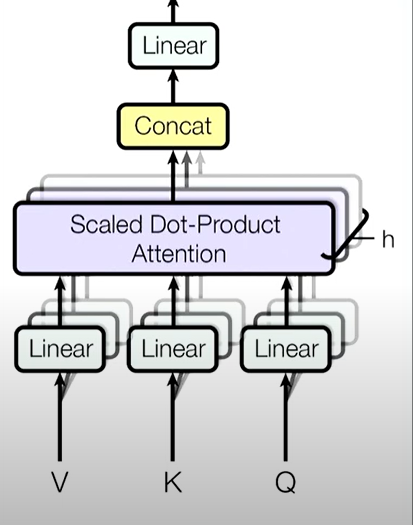

* Each of these attention layers have different "HEADs" hence the term "multi-head attention".
* The softmax of 1 head focuses on ONLY one aspect of similarity.
  * Several heads allows different specific focuses such as:
    * part of speech
    * similarity
    * context
    * ...etc...
  * The idea is that each layer can focus on a different aspect of semantic interpretation.
  * These are similar to the convoluted filters in a CNN model.

# Multi-head Attention
* Capture 3 different linear attention HEADs.
* BERT has 12 attention heads
  * So dimentions are equal to: `768 / 12 = 64`
  * 768 is input embedding dimensions

In [12]:
class AttentionHead(nn.Module):
  def __init__(self, embed_dim, head_dim):
    super().__init__()
    self.q = nn.Linear(embed_dim, head_dim) #query layer
    self.k = nn.Linear(embed_dim, head_dim) #key layer
    self.v = nn.Linear(embed_dim, head_dim) #value layer

  # forward function
  def forward(self, hidden_state):
    attn_outputs = scaled_dot_product_attention(
        self.q(hidden_state), self.k(hidden_state), self.v(hidden_state)
    )
    return attn_outputs

Note about code below:
* We are using `nn.ModuleList`
* Docs: https://pytorch.org/docs/stable/generated/torch.nn.ModuleList.html
* Why are we using this instead of a normal python list?
  * This is specific for holding submodules from PyTorch in a list.

In [13]:
class MultiHeadAttention(nn.Module):
  def __init__(self, config):
    super().__init__()
    embed_dim = config.hidden_size
    num_head = config.num_attention_heads
    head_dim = embed_dim // num_head # num of multi-heads

    # creating single attention heads
    self.heads = nn.ModuleList(
        [AttentionHead(embed_dim, embed_dim)]
    )
    self.output_linear = nn.Linear(embed_dim, embed_dim)

  # forward method
  def forward(self, hidden_state):
    """Concatenates output from multi-head attention"""
    concatenated_output = torch.cat([h(hidden_state) for h in self.heads], dim=-1) #last dimension
    concatenated_output = self.output_linear(concatenated_output)
    return concatenated_output



## Invoke the class

In [14]:
multihead_attn = MultiHeadAttention(config)
attn_output = multihead_attn(input_embeds)
# check size of output
attn_output.size()

torch.Size([1, 21, 768])

Note: This shape matches the embedding shape from above.

# Visualize Attention with BertViz
* Show sentence boundaries where attention head is located.
* Transformer documentation: https://huggingface.co/transformers/v3.0.2/model_doc/bert.html#bertforsequenceclassification
* Note
  * You will use labels or attentions depending on your task.
  * In the task below we are computing attention not the label prediction.

In [ ]:
from bertviz import head_view

from transformers import AutoModel

# instantiate model
model = AutoModel.from_pretrained(model_check, output_attentions=True, attn_implementation="eager")

## input 2 sentences to the model
sentence_a = text = "As the airplane becomes lighter, it flies higher in air of lower density to maintain the same airspeed."

sentence_b = "The corn fields are full of flies."



## inputs
viz_inputs = tokenizer(sentence_a, sentence_b, return_tensors='pt')
# set return_tensors parameter to either pt for PyTorch or tf for TensorFlow

# attentions were extracted from model output
attention = model(**viz_inputs).attentions

sentence_b_start = (viz_inputs.token_type_ids == 0).sum(dim=1)

# get the tokens - converts bert ids to tokens
tokens = tokenizer.convert_ids_to_tokens(viz_inputs.input_ids[0])

# invoke head_view
head_view(attention, tokens, sentence_b_start, heads=[21]) # list of tokens


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

# Position-wise feed forward layer
* Each encoder consists of 2 sub layers:
1. **self-attention layer:** layer that helps encoder look at other words in the input sentence as it encodes a specific word.
2. **feed-foward neural network:** exact same feed-forward network is independently applied to the word in each position through its own path in the encoder, hence it is called position-wise feed forward neural network.

## Other important things
* Similar to the multi-head attention, the **position-wise** feed-forward network will only change the last dimension size of the input.

* Also, if 2 items in the input sequence are identical, the outputs will also be identical.
* We will use `nn.GELU()`: https://pytorch.org/docs/stable/generated/torch.nn.GELU.html

In [ ]:
# feed forward network
class FeedForward(nn.Module):
  def __init__(self, config):
    super().__init__()
    # two identical fully connected layers
    self.linear1 = nn.Linear(config.hidden_size, config.intermediate_size) #input --> output
    self.linear2 = nn.Linear(config.intermediate_size, config.hidden_size)
    self.gelu = nn.GELU() #gaussian error linear units function
    self.dropout = nn.Dropout(config.hidden_dropout_prob)

  # forward func
  def forward(self, x):
    x = self.linear1(x)
    x = self.gelu(x)
    x = self.linear2(x)
    x = self.dropout(x)
    return x


In [ ]:
## test this out -- attn output to feed forward class
feed_forward = FeedForward(config)

ff_outputs = feed_forward(attn_outputs)

ff_outputs.size()

## Transformer encoder layer

In [ ]:
class TransformerEncoderLayer(nn.Module):
  def __init__(self, config):
    super().__init__()
    self.layer_norm_1 = nn.LayerNorm(config.hidden_size)
    self.layer_norm_2 = nn.LayerNorm(config.hidden_size)
    self.attention = MultiHeadAttention(config)
    self.feed_forward = FeedForward(config)

  def forward(self, x):
    # apply layer norm then copy q, k, v
    hidden_state = self.layer_norm_1(x)
    x = x + self.attention(hidden_state)
    # feed forward with skip connection
    x = x + self.feed_forward(self.layer_norm_2(x))
    return x

In [ ]:
## check its working
encoder_layer = TransformerEncoderLayer(config)
input_embeds.shape, encoder_layer(input_embeds).size()

We have now implemented the transformer encoder layer fully.

However, we now have a problem, we don't have any positional encodings.

# Positional Embeddings
* Augment token embeddings with position dependent vector patterns.
* Attention heads and feed forward layers can incorporate positional encodings.
* Learnable pattern is most popular method --> **Use position index instead of input token id.**

* Note:
  * `max_position_embeddings`: max sequence length that model might ever be used with, typically set to something large (e.g. 512, 1024, 2048)

In [ ]:
class Embeddings(nn.Module):
  def __init__(self, config):
    """ token_embeddings and position_embeddings are now implemented -- positional information is now present"""
    super().__init__()
    self.token_embeddings = nn.Embedding(config.vocab_size, config.hidden_size)
    self.position_embeddings = nn.Embedding(config.max_position_embeddings, config.hidden_size)
    self.layer_norm = nn.LayerNorm(config.hidden_size, eps=1e-12)
    self.dropout = nn.Dropout()

  # forward method
  def forward(self, input_ids):
    #position ids for input sequence
    seq_length = input_ids.size(1)
    position_ids = torch.arange(seq_length, dtype=torch.long).unsqueeze(0) #flatten it
    token_embeddings = self.token_embeddings(input_ids)
    position_embeddings = self.position_embeddings(position_ids)
    embeddings = token_embeddings + position_embeddings
    # update with layer norm
    embedddings = self.layer_norm(embeddings)
    # update dropout
    embeddings = self.dropout(embeddings)
    return embeddings

In [ ]:
## invoke embedding class
embedding_layer = Embeddings(config)
embedding_layer(inputs.input_ids).size()

# Put it all together
* We now have the embedding and encoder model together in the final class below.

In [27]:
class TransformerEncode(nn.Module):
  def __init__(self, config):
    super().__init__()
    self.embeddings = Embeddings(config) # invoke previous embeddings class
    self.layers = nn.ModuleList([TransformerEncoderLayer(config) for _ in range(config.num_hidden_layers) ])

  # forward function
  def forward(self, x):
    x = self.embeddings(x)
    for layer in self.layers:
      x = layer(x)
    return x

In [28]:
# verify this works
encoder = TransformerEncode(config)
encoder(inputs.input_ids).size()

torch.Size([1, 21, 768])

# Add task-specific head - classification task

* So far we have built the BODY/core part
* We now need to build a task-specific head --> in this case classification

In [29]:
class TransformerForSequenceClassification(nn.Module):
  def __init__(self, config):
    super().__init__()
    self.encoder = TransformerEncode(config)
    self.dropout = nn.Dropout(config.hidden_dropout_prob)
    self.classifier = nn.Linear(config.hidden_size, config.num_labels)

  # forward method
  def forward(self, x):
    x = self.encoder(x)[:, 0, :] # select hidden state of [CLS] token
    x = self.dropout(x)
    x = self.classifier(x)
    return x

### Need to define number of prediction clases

In [30]:
# number of labels
config.num_labels = 3
# encoder_classifier
encoder_classifier = TransformerForSequenceClassification(config)
encoder_classifier(inputs.input_ids).size()

torch.Size([1, 3])

# Encoder vs. Decoder Architecture
* The encoder in the transformer consists of multiple encoder blocks. An input sentence goes through the encoder blocks, and the output of the last encoder block becomes the input features to the decoder.
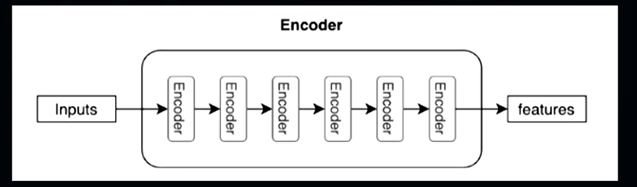

The decoder also consists of multiple decoder blocks. Each decoder block receives the features from the encoder. If we draw the encoder and the decoder vertically, the whole picture looks like the diagram from the paper.

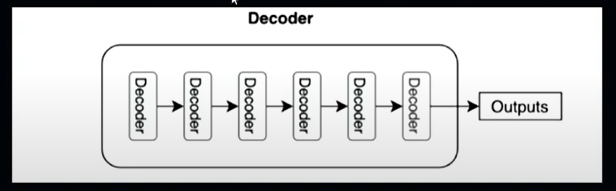

### Encoder-Decoder architecture as a whole

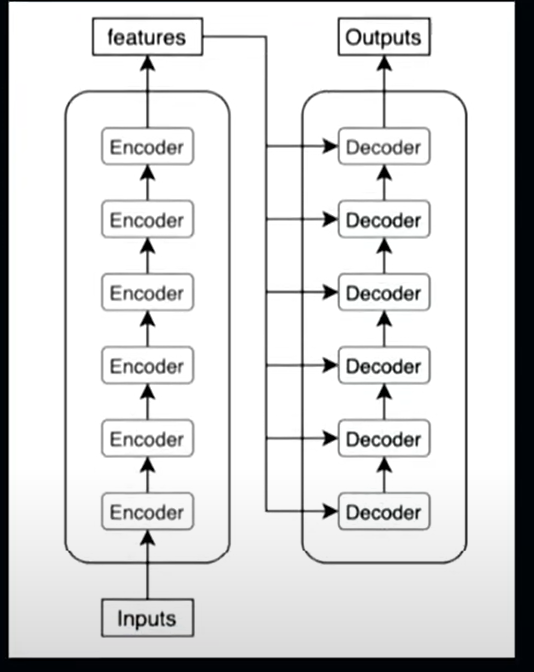

### Compact view of encoder-decoder from the original paper
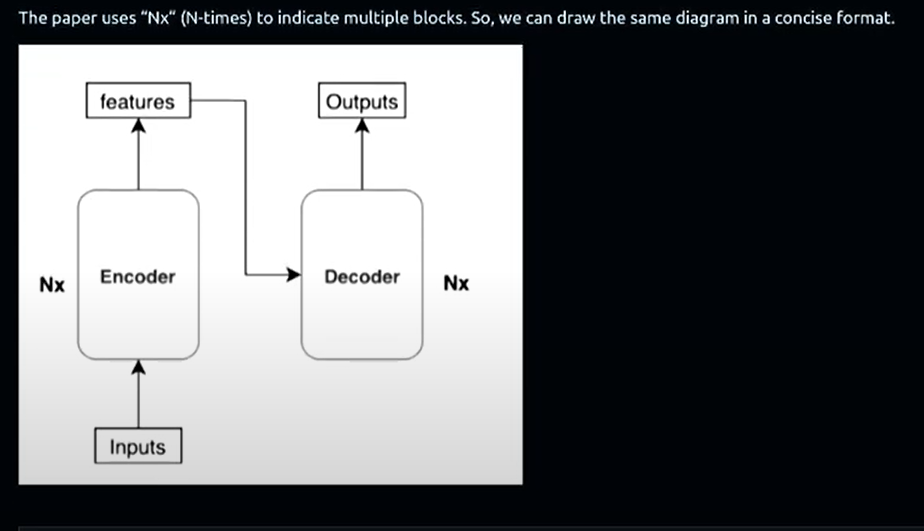

### Encoder-Decoder architecture as a whole
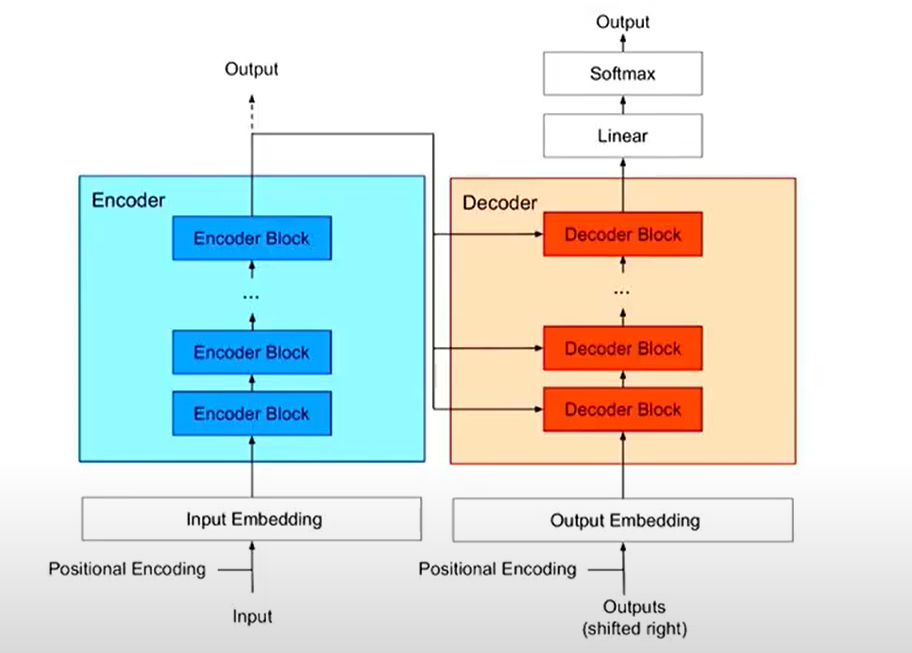
